In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="GZQJhkzwfnVCnfRzRhJf")
project = rf.workspace("bryan-b56jm").project("tomato-leaf-disease-ssoha")
version = project.version(63)
dataset = version.download("yolov11")
                

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 35.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 89.2 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sigstore 3.6.1 requires rich~=13.0, but you have rich 14.0.0 which is incompatible.
datasets 3.5.0 requires fsspec[http]<=2024.12.0,>=2023.1.0, 


Extracting Dataset Version Zip to Tomato-Leaf-Disease-63 in yolov11:: 100%|██████████| 20106/20106 [00:02<00:00, 7138.28it/s]


In [2]:
import os

def count_multiclass_images(label_dir):
    one_class = 0
    multi_class = 0

    for fname in os.listdir(label_dir):
        if not fname.endswith('.txt'):
            continue
        label_path = os.path.join(label_dir, fname)
        with open(label_path, 'r') as f:
            lines = f.readlines()

        class_ids = [line.strip().split()[0] for line in lines]
        unique_class_ids = set(class_ids)

        if len(unique_class_ids) == 1:
            one_class += 1
        elif len(unique_class_ids) > 1:
            multi_class += 1

    return one_class, multi_class

# Set base dataset path
base_path = '/kaggle/working/Tomato-Leaf-Disease-63'

for split in ['train', 'valid', 'test']:
    label_dir = os.path.join(base_path, split, 'labels')
    one, multi = count_multiclass_images(label_dir)
    print(f"{split.capitalize()} Set:")
    print(f"  Single-class images: {one}")
    print(f"  Multi-class images : {multi}\n")


Train Set:
  Single-class images: 4712
  Multi-class images : 4327

Valid Set:
  Single-class images: 478
  Multi-class images : 365

Test Set:
  Single-class images: 72
  Multi-class images : 93



In [3]:
import os
import cv2
from pathlib import Path
from tqdm import tqdm

# === CONFIG ===
ORIGINAL_DATASET = "/kaggle/working/Tomato-Leaf-Disease-63"
OUTPUT_DATASET = "/kaggle/working/cropped_dataset"

CLASS_NAMES = [
    "Early Blight",
    "Healthy",
    "Late Blight",
    "Leaf Miner",
    "Leaf Mold",
    "Mosaic Virus",
    "Septoria",
    "Spider Mites",
    "Yellow Leaf Curl Virus"
]

# === Convert YOLO bbox (normalized cx, cy, w, h) -> pixel [x1, y1, x2, y2]
def yolo_to_xyxy(box, img_w, img_h):
    xc, yc, w, h = box
    x1 = int((xc - w / 2) * img_w)
    y1 = int((yc - h / 2) * img_h)
    x2 = int((xc + w / 2) * img_w)
    y2 = int((yc + h / 2) * img_h)
    return [x1, y1, x2, y2]

# === Main cropping function
def crop_yolo_labels(split):
    img_dir = Path(ORIGINAL_DATASET) / split / "images"
    label_dir = Path(ORIGINAL_DATASET) / split / "labels"
    output_dir = Path(OUTPUT_DATASET) / split

    for label_file in tqdm(list(label_dir.glob("*.txt")), desc=f"Cropping {split}"):
        img_name = label_file.stem + ".jpg"
        img_path = img_dir / img_name

        if not img_path.exists():
            continue

        image = cv2.imread(str(img_path))
        if image is None:
            continue
        h, w = image.shape[:2]

        with open(label_file, "r") as f:
            lines = f.readlines()

        for idx, line in enumerate(lines):
            parts = list(map(float, line.strip().split()))
            class_id = int(parts[0])
            bbox = parts[1:]

            x1, y1, x2, y2 = yolo_to_xyxy(bbox, w, h)

            # Clip to image bounds
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w, x2), min(h, y2)
            if x2 <= x1 or y2 <= y1:
                continue

            crop = image[y1:y2, x1:x2]
            class_name = CLASS_NAMES[class_id]
            class_folder = output_dir / class_name
            class_folder.mkdir(parents=True, exist_ok=True)

            out_name = f"{label_file.stem}_{idx}.jpg"
            out_path = class_folder / out_name
            cv2.imwrite(str(out_path), crop)

# === Run for train, valid, test
for split in ["train", "valid", "test"]:
    crop_yolo_labels(split)

print("✅ All crops saved successfully.")


Cropping test: 100%|██████████| 165/165 [00:00<00:00, 315.15it/s]

✅ All crops saved successfully.


In [4]:
import os
from pathlib import Path
from collections import defaultdict

CROPPED_DATASET = "/kaggle/working/cropped_dataset"
SPLITS = ["train", "valid", "test"]

print("📊 Number of cropped images per class per split:\n")

for split in SPLITS:
    split_path = Path(CROPPED_DATASET) / split
    class_counts = defaultdict(int)

    if not split_path.exists():
        print(f"{split.capitalize()} split not found.")
        continue

    for class_folder in split_path.iterdir():
        if class_folder.is_dir():
            count = len(list(class_folder.glob("*.jpg")))
            class_counts[class_folder.name] = count

    print(f"🔹 {split.capitalize()} Split:")
    for class_name, count in sorted(class_counts.items()):
        print(f"  - {class_name}: {count} images")
    print("")


📊 Number of cropped images per class per split:

🔹 Train Split:
  - Early Blight: 3141 images
  - Healthy: 3336 images
  - Late Blight: 4264 images
  - Leaf Miner: 3171 images
  - Leaf Mold: 4186 images
  - Mosaic Virus: 4057 images
  - Septoria: 3888 images
  - Spider Mites: 2721 images
  - Yellow Leaf Curl Virus: 5102 images

🔹 Valid Split:
  - Early Blight: 252 images
  - Healthy: 277 images
  - Late Blight: 344 images
  - Leaf Miner: 259 images
  - Leaf Mold: 338 images
  - Mosaic Virus: 319 images
  - Septoria: 324 images
  - Spider Mites: 252 images
  - Yellow Leaf Curl Virus: 315 images

🔹 Test Split:
  - Early Blight: 72 images
  - Healthy: 68 images
  - Late Blight: 72 images
  - Leaf Miner: 56 images
  - Leaf Mold: 87 images
  - Mosaic Virus: 77 images
  - Septoria: 41 images
  - Spider Mites: 44 images
  - Yellow Leaf Curl Virus: 50 images



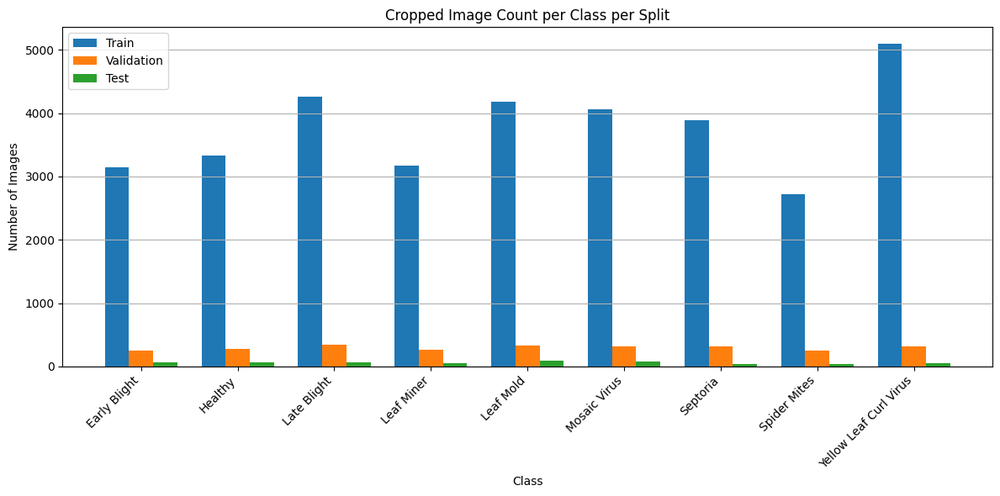

In [5]:
import os
from pathlib import Path
from collections import defaultdict
import matplotlib.pyplot as plt

# === CONFIG ===
CROPPED_DATASET = "cropped_dataset"
SPLITS = ["train", "valid", "test"]
CLASS_NAMES = [
    "Early Blight",
    "Healthy",
    "Late Blight",
    "Leaf Miner",
    "Leaf Mold",
    "Mosaic Virus",
    "Septoria",
    "Spider Mites",
    "Yellow Leaf Curl Virus"
]

# === Count images per class per split
counts = {split: {cls: 0 for cls in CLASS_NAMES} for split in SPLITS}

for split in SPLITS:
    split_path = Path(CROPPED_DATASET) / split
    if not split_path.exists():
        continue

    for class_folder in split_path.iterdir():
        if class_folder.is_dir():
            class_name = class_folder.name
            count = len(list(class_folder.glob("*.jpg")))
            if class_name in CLASS_NAMES:
                counts[split][class_name] = count

# === Plotting
x = CLASS_NAMES
x_indices = range(len(x))
bar_width = 0.25

train_counts = [counts['train'][cls] for cls in x]
val_counts = [counts['valid'][cls] for cls in x]
test_counts = [counts['test'][cls] for cls in x]

plt.figure(figsize=(12, 6))
plt.bar([i - bar_width for i in x_indices], train_counts, width=bar_width, label="Train")
plt.bar(x_indices, val_counts, width=bar_width, label="Validation")
plt.bar([i + bar_width for i in x_indices], test_counts, width=bar_width, label="Test")

plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.title("Cropped Image Count per Class per Split")
plt.xticks(ticks=x_indices, labels=x, rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.grid(axis='y')
plt.show()



🔍 Showing 3 random images per class from: train


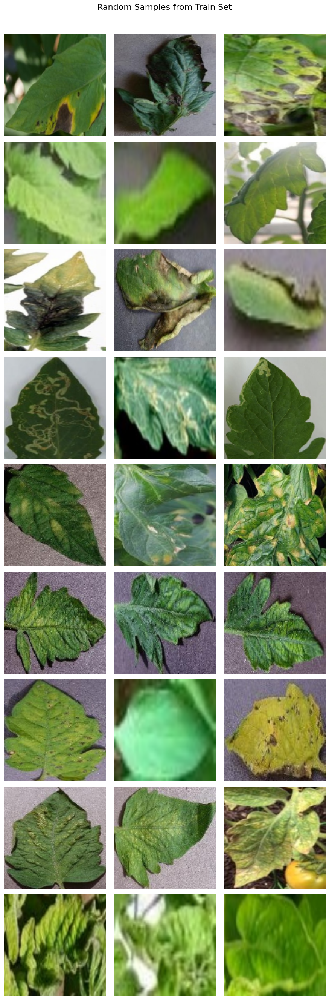


🔍 Showing 3 random images per class from: valid


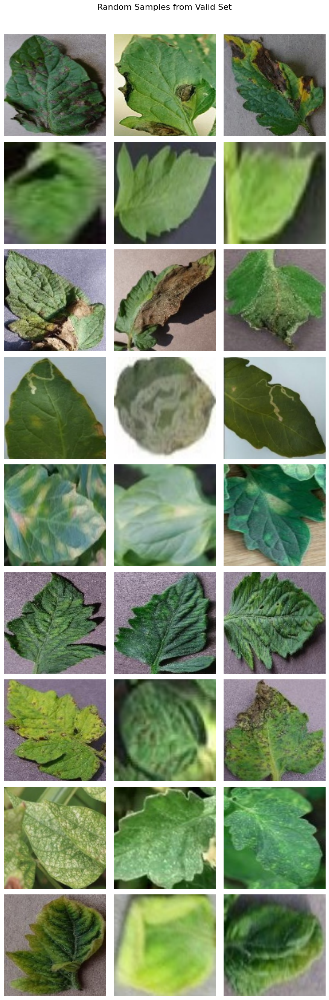


🔍 Showing 3 random images per class from: test


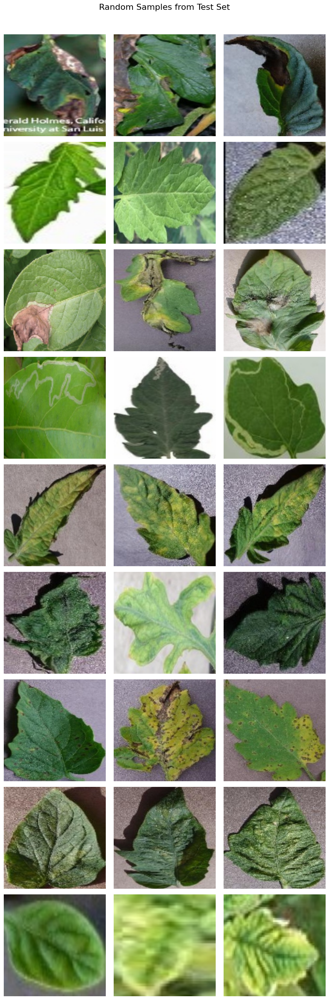

In [6]:
import os
import random
from pathlib import Path
import matplotlib.pyplot as plt
import cv2

# === CONFIG ===
CROPPED_DATASET = "/kaggle/working/cropped_dataset"
SPLITS = ["train", "valid", "test"]
CLASS_NAMES = [
    "Early Blight",
    "Healthy",
    "Late Blight",
    "Leaf Miner",
    "Leaf Mold",
    "Mosaic Virus",
    "Septoria",
    "Spider Mites",
    "Yellow Leaf Curl Virus"
]
SAMPLES_PER_CLASS = 3
IMG_SIZE = (128, 128)  # Resize for display

# === Plotting Function
def plot_random_images_per_class(split):
    print(f"\n🔍 Showing 3 random images per class from: {split}")
    n_classes = len(CLASS_NAMES)
    fig, axes = plt.subplots(n_classes, SAMPLES_PER_CLASS, figsize=(SAMPLES_PER_CLASS*3, n_classes*3))

    for row, class_name in enumerate(CLASS_NAMES):
        class_path = Path(CROPPED_DATASET) / split / class_name
        if not class_path.exists():
            continue
        images = list(class_path.glob("*.jpg"))
        if len(images) == 0:
            continue

        selected = random.sample(images, min(SAMPLES_PER_CLASS, len(images)))
        for col in range(SAMPLES_PER_CLASS):
            ax = axes[row][col] if n_classes > 1 else axes[col]
            ax.axis("off")
            if col < len(selected):
                img = cv2.imread(str(selected[col]))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, IMG_SIZE)
                ax.imshow(img)
            if col == 0:
                ax.set_ylabel(class_name, fontsize=10)

    plt.suptitle(f"Random Samples from {split.capitalize()} Set", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

# === Run for all splits
for split in SPLITS:
    plot_random_images_per_class(split)


In [7]:
import os
from pathlib import Path
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# === CONFIG ===
DATA_DIR = "cropped_dataset"
BATCH_SIZE = 32
NUM_EPOCHS = 10
IMG_SIZE = 128
NUM_WORKERS = 2
LEARNING_RATE = 1e-4
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [8]:
# === Transforms
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# === Datasets and Loaders
train_ds = datasets.ImageFolder(os.path.join(DATA_DIR, "train"), transform=transform)
val_ds = datasets.ImageFolder(os.path.join(DATA_DIR, "valid"), transform=transform)
test_ds = datasets.ImageFolder(os.path.join(DATA_DIR, "test"), transform=transform)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

CLASS_NAMES = train_ds.classes
NUM_CLASSES = len(CLASS_NAMES)

In [9]:
NUM_CLASSES ,CLASS_NAMES

(9,
 ['Early Blight',
  'Healthy',
  'Late Blight',
  'Leaf Miner',
  'Leaf Mold',
  'Mosaic Virus',
  'Septoria',
  'Spider Mites',
  'Yellow Leaf Curl Virus'])

In [10]:
# === Model
model = models.resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
model.to(DEVICE)

# === Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 166MB/s]


In [11]:
# === Early Stopping and Model Saving Setup
BEST_VAL_LOSS = float('inf')
PATIENCE = 3
EARLY_STOP_COUNTER = 0
CHECKPOINT_PATH = "best_resnet50_model.pt"

for epoch in range(NUM_EPOCHS):
    model.train()
    train_loss, train_correct = 0.0, 0
    for inputs, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} - Training"):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_correct += (outputs.argmax(1) == labels).sum().item()

    train_acc = train_correct / len(train_ds)
    avg_train_loss = train_loss / len(train_loader)

    # === Validation
    model.eval()
    val_loss, val_correct = 0.0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            val_correct += (outputs.argmax(1) == labels).sum().item()

    val_acc = val_correct / len(val_ds)
    avg_val_loss = val_loss / len(val_loader)

    print(f"Epoch {epoch+1}/{NUM_EPOCHS} | "
          f"Train Loss: {avg_train_loss:.4f}, Train Acc: {train_acc:.4f} | "
          f"Val Loss: {avg_val_loss:.4f}, Val Acc: {val_acc:.4f}")

    # === Save Best Model
    if avg_val_loss < BEST_VAL_LOSS:
        BEST_VAL_LOSS = avg_val_loss
        EARLY_STOP_COUNTER = 0
        torch.save(model.state_dict(), CHECKPOINT_PATH)
        print(f"✅ Saved new best model at epoch {epoch+1}")
    else:
        EARLY_STOP_COUNTER += 1
        print(f"⏳ No improvement. Early stop counter: {EARLY_STOP_COUNTER}/{PATIENCE}")

    # === Early Stopping Trigger
    if EARLY_STOP_COUNTER >= PATIENCE:
        print("⛔ Early stopping triggered.")
        break


Epoch 1/10 - Training: 100%|██████████| 1059/1059 [02:00<00:00,  8.76it/s]


Epoch 1/10 | Train Loss: 0.3046, Train Acc: 0.9012 | Val Loss: 0.1401, Val Acc: 0.9504
✅ Saved new best model at epoch 1


Epoch 2/10 - Training: 100%|██████████| 1059/1059 [02:02<00:00,  8.68it/s]


Epoch 2/10 | Train Loss: 0.1077, Train Acc: 0.9658 | Val Loss: 0.1638, Val Acc: 0.9537
⏳ No improvement. Early stop counter: 1/3


Epoch 3/10 - Training: 100%|██████████| 1059/1059 [02:03<00:00,  8.59it/s]


Epoch 3/10 | Train Loss: 0.0694, Train Acc: 0.9771 | Val Loss: 0.1613, Val Acc: 0.9612
⏳ No improvement. Early stop counter: 2/3


Epoch 4/10 - Training: 100%|██████████| 1059/1059 [02:04<00:00,  8.53it/s]


Epoch 4/10 | Train Loss: 0.0530, Train Acc: 0.9831 | Val Loss: 0.1411, Val Acc: 0.9582
⏳ No improvement. Early stop counter: 3/3
⛔ Early stopping triggered.



✅ Validation Accuracy: 0.9582
✅ Validation F1 Score:  0.9581

Classification Report (Validation):

                        precision    recall  f1-score   support

          Early Blight       0.90      0.97      0.94       252
               Healthy       0.91      0.99      0.95       277
           Late Blight       0.99      0.93      0.96       344
            Leaf Miner       0.98      0.99      0.98       259
             Leaf Mold       0.95      0.98      0.97       338
          Mosaic Virus       0.99      0.92      0.95       319
              Septoria       0.99      0.89      0.94       324
          Spider Mites       0.97      0.99      0.98       252
Yellow Leaf Curl Virus       0.95      0.98      0.96       315

              accuracy                           0.96      2680
             macro avg       0.96      0.96      0.96      2680
          weighted avg       0.96      0.96      0.96      2680


Confusion Matrix (Validation):


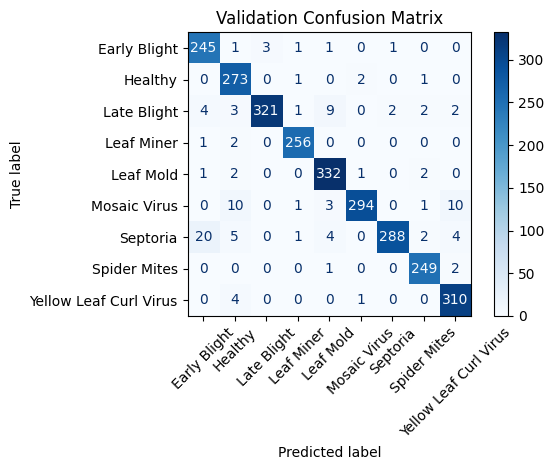


✅ Test Accuracy: 0.9700
✅ Test F1 Score:  0.9700

Classification Report (Test):

                        precision    recall  f1-score   support

          Early Blight       0.97      0.93      0.95        72
               Healthy       0.97      1.00      0.99        68
           Late Blight       0.95      0.97      0.96        72
            Leaf Miner       1.00      0.95      0.97        56
             Leaf Mold       0.97      0.99      0.98        87
          Mosaic Virus       1.00      0.94      0.97        77
              Septoria       0.98      1.00      0.99        41
          Spider Mites       1.00      0.98      0.99        44
Yellow Leaf Curl Virus       0.91      1.00      0.95        50

              accuracy                           0.97       567
             macro avg       0.97      0.97      0.97       567
          weighted avg       0.97      0.97      0.97       567


Confusion Matrix (Test):


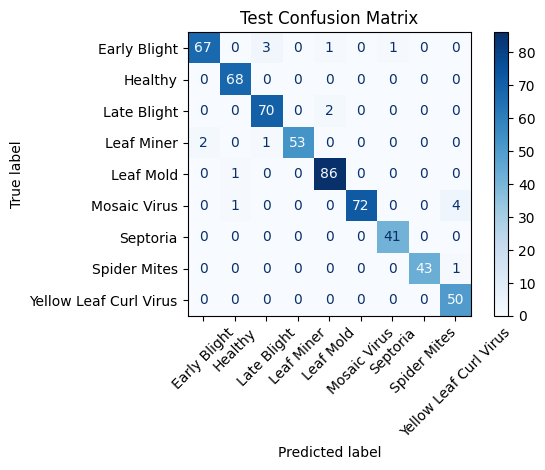

In [12]:
# === Evaluation Function
def evaluate_model(dataloader, split_name):
    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(DEVICE)
            outputs = model(inputs)
            preds = outputs.argmax(1).cpu().numpy()
            y_pred.extend(preds)
            y_true.extend(labels.numpy())

    acc = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average="weighted")
    print(f"\n✅ {split_name} Accuracy: {acc:.4f}")
    print(f"✅ {split_name} F1 Score:  {f1:.4f}")
    print(f"\nClassification Report ({split_name}):\n")
    print(classification_report(y_true, y_pred, target_names=CLASS_NAMES))
    print(f"\nConfusion Matrix ({split_name}):")
    disp = ConfusionMatrixDisplay.from_predictions(y_true, y_pred, display_labels=CLASS_NAMES, xticks_rotation=45, cmap="Blues")
    plt.title(f"{split_name} Confusion Matrix")
    plt.tight_layout()
    plt.show()

# === Evaluate on Validation and Test Sets
evaluate_model(val_loader, "Validation")
evaluate_model(test_loader, "Test")
